In [3]:
import tkinter as tk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import numpy as np
from matplotlib import pyplot as plt

In [1]:
def step(coeff_numerator, coeff_denominator, plane):
    return np.polyval(coeff_numerator, plane) / np.polyval(coeff_denominator, plane)

def iterate(plane, coeff_numerator, coeff_denominator, threshold, N):
    Iterations = np.zeros(shape=np.shape(plane))
    for k, array in enumerate(plane):
        for l, x in enumerate(array):
            for i in range(1,N):
                x = step(coeff_numerator, coeff_denominator, x)
                if np.abs(x) > threshold:
                    Iterations[k][l] = i
                    break
    return Iterations

def Julia(range = [-1,1], npoints = 10, maxiter = 100, coeff1 = [1, 0, 1j], coeff2 = [1]):
    x = np.linspace(range[0], range[1], npoints)
    y = x * 1j
    X, Y = np.meshgrid(x, y)
    complex_space = X + Y
    c = iterate(complex_space, coeff1, coeff2, 1e4, maxiter)
    plt.figure(figsize = (16,12), dpi = 400)
    plt.scatter(np.real(complex_space), np.imag(complex_space), c=c, cmap = 'hot')

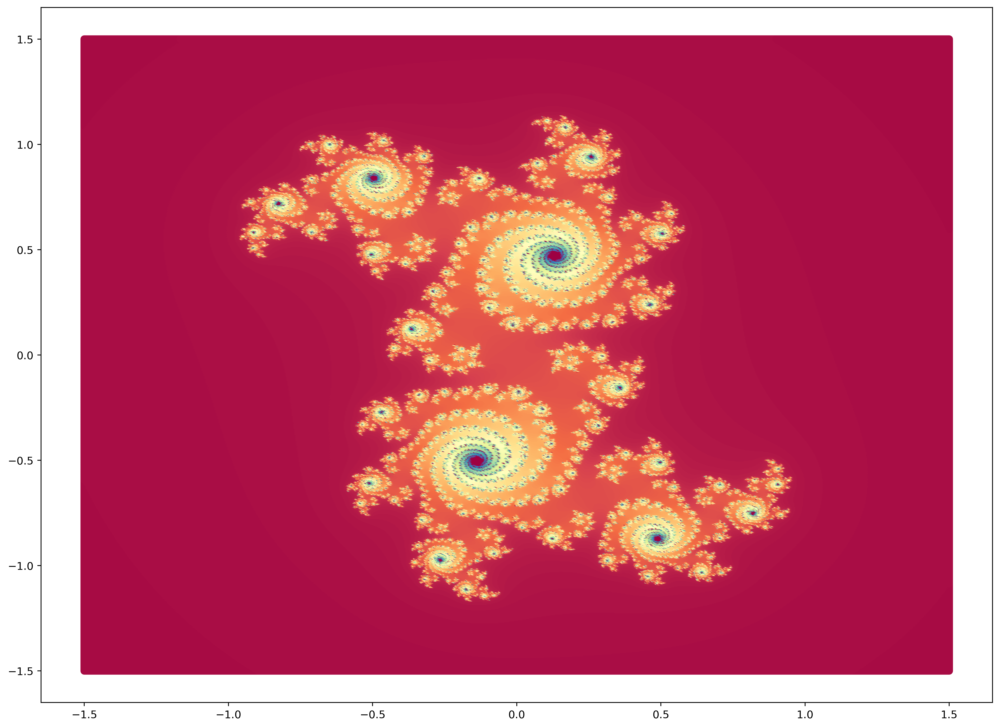

In [18]:
Julia([-3/2, 3/2], 1000, 255, [1,0, 0.355 + 0.355j])

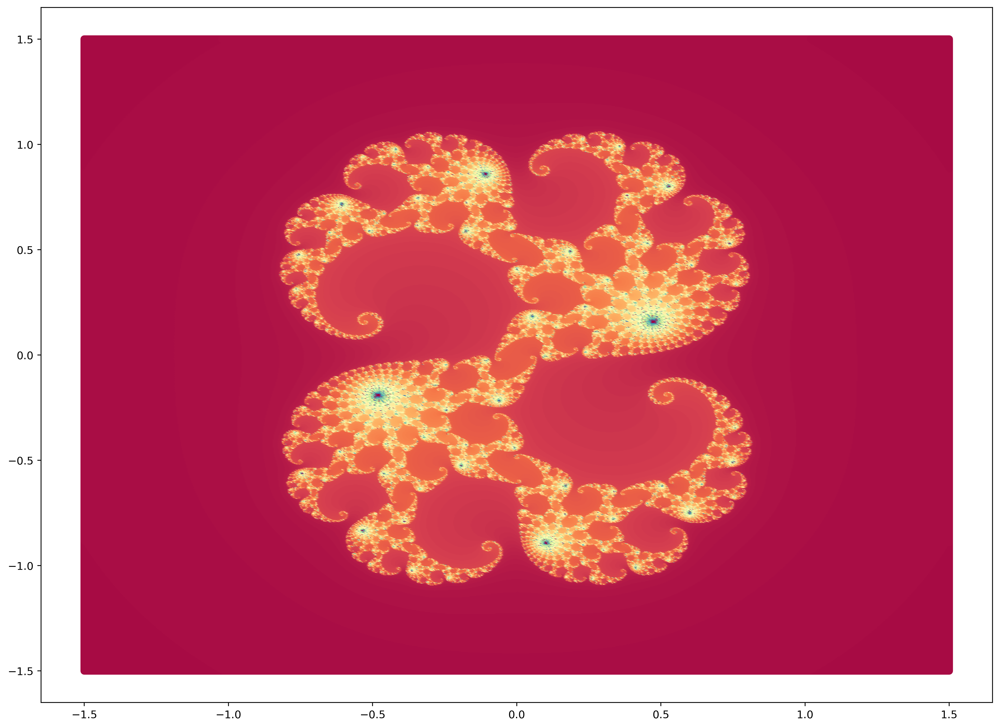

In [19]:
Julia([-3/2, 3/2], 1000, 255, [1,0, 0.28 + 0.008j])

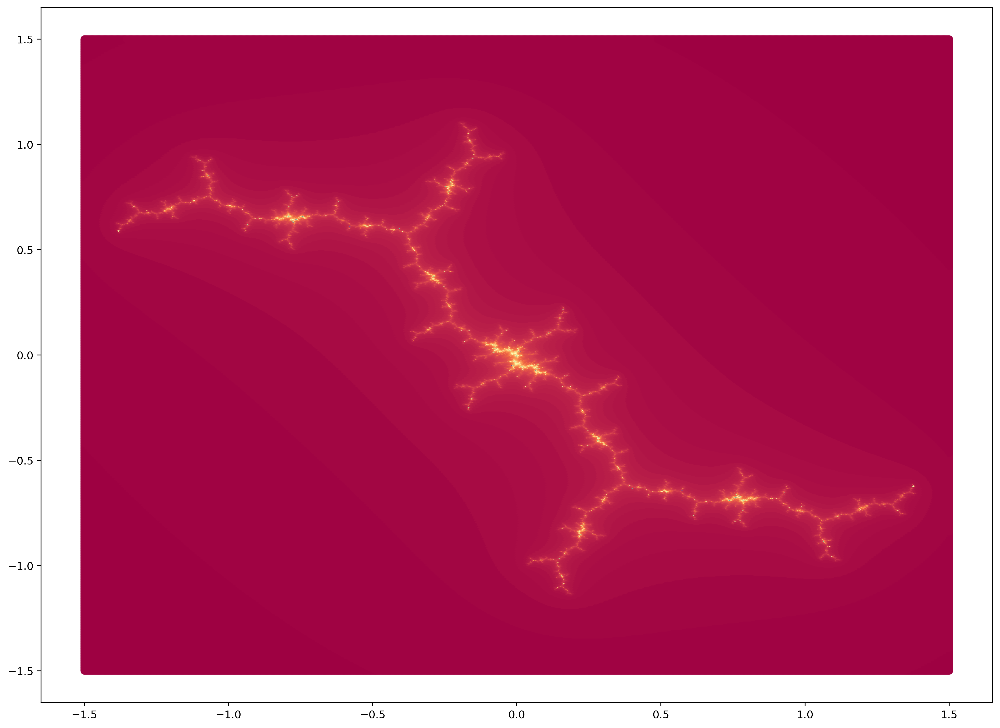

In [20]:
Julia([-3/2, 3/2], 1000, 255, [1,0, -0.162 + 1.04j])

In [12]:
# Function to handle the button click
def on_button_click():
    coeff_numerator = [complex(x) for x in entry_p.get().split(',')]
    coeff_denominator = [complex(x) for x in entry_q.get().split(',')]
    range_vals = [float(x) for x in entry_range.get().split(',')]
    precision = int(entry_precision.get())

    x = np.linspace(float(range_vals[0]), float(range_vals[1]), 255)
    y = x * 1j
    X, Y = np.meshgrid(x, y)
    plane = X + Y
    c = iterate(plane, coeff_numerator, coeff_denominator, 1e4, int(precision))
    create_plot(plane, c)

def create_plot(plane, c):
    # Clear any previous plot
    for widget in result_canvas.winfo_children():
        widget.destroy()
    
    # Create a new canvas for the plot in the same grid cell
    result_canvas.grid_forget()
    result_canvas.grid(row=0, column=1, rowspan=5, padx=20)
    
    fig = Figure(figsize=(4, 3), dpi=300)
    plot = fig.add_subplot(111)
    plot.scatter(np.real(plane), np.imag(plane), c=c, cmap='plasma', s=1)
    canvas = FigureCanvasTkAgg(fig, master=result_canvas)
    canvas_widget = canvas.get_tk_widget()
    canvas_widget.pack()

# Create the main window
root = tk.Tk()
root.title("Julia sets from a quotient of polynomials")
root.geometry("1400x900")  # Set your desired width and height


# Create frames for coefficients
frame_p = tk.Frame(root)
frame_q = tk.Frame(root)
frame_range = tk.Frame(root)
frame_precision = tk.Frame(root)

# Create labels for the coefficients
label_p = tk.Label(frame_p, text="Coefficient a:")
label_q = tk.Label(frame_q, text="Coefficient b:")
label_range = tk.Label(frame_range, text="Range:")
label_precision = tk.Label(frame_precision, text="maxiter")

# Create entry widgets for the coefficients
entry_p = tk.Entry(frame_p)
entry_q = tk.Entry(frame_q)
entry_range = tk.Entry(frame_range)
entry_precision = tk.Entry(frame_precision)

# Pack labels and entry widgets in their respective frames
label_p.pack(side="left")
entry_p.pack(side="right")
label_q.pack(side="left")
entry_q.pack(side="right")
label_range.pack(side="left")
entry_range.pack(side="right")
label_precision.pack(side="left")
entry_precision.pack(side="right")

# Create a button
button = tk.Button(root, text="Calculate", command=on_button_click)

# Place frames, labels, entry widgets, and button in a grid
frame_p.grid(row=0, column=0)
frame_q.grid(row=1, column=0)
frame_range.grid(row=2, column=0)
frame_precision.grid(row=3, column=0)
button.grid(row=4, column=0)

# Create a canvas for displaying the plot
result_canvas = tk.Frame(root, width=400, height=300)
result_canvas.grid(row=0, column=1, rowspan=5, padx=20)

# Start the tkinter main loop
root.mainloop()
